# **Project Name**    -  Mobile Price Range Prediction



##### **Project Type**    - Classification
##### **Contribution**    - Individual


# **Project Summary -**

Write the summary here within 500-600 words.

# **GitHub Link -**

https://github.com/Akash1141/Mobile_Price_Range_Prediction

# **Problem Statement**


**In the competative mobile phone market companies want to understand sales data of mobile phones and factors which drive the prices. The objective is to find out some relation between features of a mobile phone (eg:- RAM, Internal Memory etc) and its selling price. In this problem we do not have to prdict the actual price but a price range indicating how high the price is.**

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [31]:
# Import Libraries

import numpy as np # NumPy is used for scientific computing and provides functions for efficient array operations, linear algebra, and mathematical calculations.
import pandas as pd # Pandas is used for data manipulation and analysis. It provides data structures and functions to work with structured data, such as data frames.
from numpy import math # The math module from NumPy provides various mathematical functions that can be used for calculations.
from scipy.stats import * # The scipy.stats module provides a wide range of statistical functions and distributions for statistical analysis and hypothesis testing.
import math
from numpy import loadtxt # The loadtxt function from NumPy is used to load data from a text file into an array or variables.

from sklearn.preprocessing import MinMaxScaler # MinMaxScaler is used for scaling numerical features to a specific range, typically between 0 and 1, to ensure that all features have a similar scale.
from sklearn.model_selection import train_test_split # train_test_split is used to split the dataset into training and testing sets for model evaluation and validation.
from sklearn.linear_model import LinearRegression # LinearRegression is used to perform linear regression analysis and build linear regression models.
from sklearn.metrics import r2_score # r2_score is used to calculate the coefficient of determination (R-squared) to evaluate the performance of regression models.
from sklearn.metrics import mean_squared_error # mean_squared_error is used to calculate the mean squared error (MSE) to measure the performance of regression models.


import matplotlib.pyplot as plt # Matplotlib is a plotting library used to create visualizations and graphs. The %matplotlib inline command is used in Jupyter Notebook to display plots inline.
%matplotlib inline

import seaborn as sns # Seaborn is a data visualization library based on Matplotlib. It provides a high-level interface for creating informative and visually appealing statistical graphics.

from sklearn.linear_model import Ridge, RidgeCV # Ridge and Lasso are regularization techniques used in linear regression to reduce overfitting.
from sklearn.linear_model import Lasso, LassoCV # RidgeCV and LassoCV are versions of Ridge and Lasso with built-in cross-validation for hyperparameter tuning.
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler # StandardScaler is used to standardize numerical features by removing the mean and scaling to unit variance.
from imblearn.over_sampling import SMOTE # SMOTE (Synthetic Minority Over-sampling Technique) is used for oversampling the minority class in imbalanced datasets to address class imbalance issues.
from sklearn.linear_model import LogisticRegression # LogisticRegression is used for logistic regression analysis and building logistic regression models for classification tasks.
from sklearn.ensemble import RandomForestClassifier # RandomForestClassifier is an ensemble learning method that combines multiple decision trees to build a classification model.
from sklearn.metrics import accuracy_score, confusion_matrix # accuracy_score is used to calculate the accuracy of classification models. confusion_matrix is used to compute the confusion matrix to evaluate classification model performance.
from sklearn import metrics # metrics provides various metrics for model evaluation.
from sklearn.metrics import roc_curve # roc_curve is used to plot the receiver operating characteristic (ROC) curve for binary classification models.
from sklearn.model_selection import GridSearchCV # GridSearchCV is used for hyperparameter tuning by exhaustively searching the specified parameter values.
from sklearn.model_selection import RepeatedStratifiedKFold # RepeatedStratifiedKFold is a cross-validation strategy that ensures stratification and repeated sampling of data during model evaluation.
from xgboost import XGBClassifier # XGBClassifier is an implementation of the XGBoost algorithm for classification tasks.
from xgboost import XGBRFClassifier # XGBRFClassifier is an implementation of the XGBoost algorithm for random forest-based classification tasks.
from sklearn.tree import export_graphviz # export_graphviz is used to export decision tree models in Graphviz format for visualization.

import warnings
warnings.filterwarnings('ignore') # The warnings module is used to manage warning messages. The filterwarnings function is used to ignore warnings during code execution.


### Dataset Loading

In [32]:
# Load Dataset
ml = "/content/data_mobile_price_range.csv"

In [33]:
# Loading  Dataset

df = pd.read_csv(ml, encoding = "ISO-8859-1") # Some times while saving the CSV File the data shall be encoded, to over come this issue in future we use this label
# encoding = "ISO-8859-1" when reading the file with pandas will ensure that the text is decoded properly and can be read correctly by the program.

### Dataset First View

In [34]:
# Dataset First Look
df.head(15)
df.tail(15)

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1985,1829,1,2.1,0,8,0,59,0.1,91,5,...,1457,1919,3142,16,6,5,1,1,1,3
1986,1139,1,0.9,1,6,1,58,0.5,161,2,...,742,999,1850,9,4,8,1,0,0,1
1987,618,1,1.0,0,9,1,13,0.1,80,4,...,591,724,1424,15,12,7,1,1,0,0
1988,1547,1,2.9,0,2,0,57,0.4,114,1,...,347,957,1620,9,2,19,0,1,1,1
1989,586,0,2.8,0,2,0,15,0.2,83,3,...,241,854,2592,12,8,3,0,0,0,1
1990,1617,1,2.4,0,8,1,36,0.8,85,1,...,743,1426,296,5,3,7,1,0,0,0
1991,1882,0,2.0,0,11,1,44,0.8,113,8,...,4,743,3579,19,8,20,1,1,0,3
1992,674,1,2.9,1,1,0,21,0.2,198,3,...,576,1809,1180,6,3,4,1,1,1,0
1993,1467,1,0.5,0,0,0,18,0.6,122,5,...,888,1099,3962,15,11,5,1,1,1,3
1994,858,0,2.2,0,1,0,50,0.1,84,1,...,528,1416,3978,17,16,3,1,1,0,3


### Dataset Rows & Columns count

In [35]:
# Dataset Rows & Columns count
df.shape

(2000, 21)

### Dataset Information

In [36]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

#### Duplicate Values

In [37]:
# Dataset Duplicate Value Count
# check for duplicates
if df.duplicated().any():
    print("There are duplicates in the dataset.")
else:
    print("There are no duplicates in the dataset.")

# Check for duplicates count
duplicates = df.duplicated()
print('\nDuplicates:\n', duplicates.sum())

There are no duplicates in the dataset.

Duplicates:
 0


#### Missing Values/Null Values

In [38]:
# Missing Values/Null Values Count
print(df.isnull().sum())

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


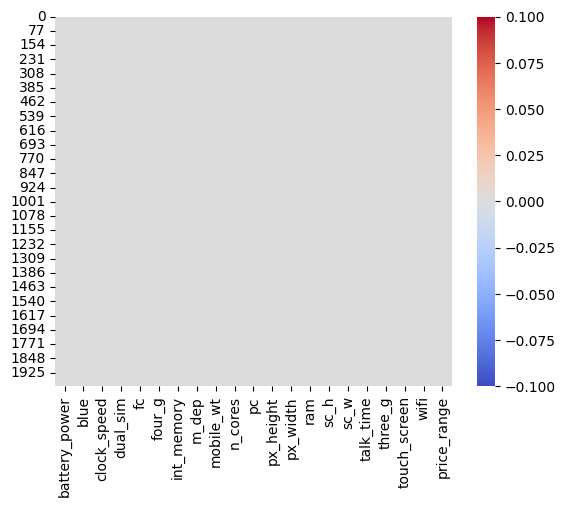

In [39]:
# Visualizing the missing values

# Create a heatmap of missing/null values in the DataFrame
sns.heatmap(df.isnull(), cmap='coolwarm')

# Show the plot
plt.show()

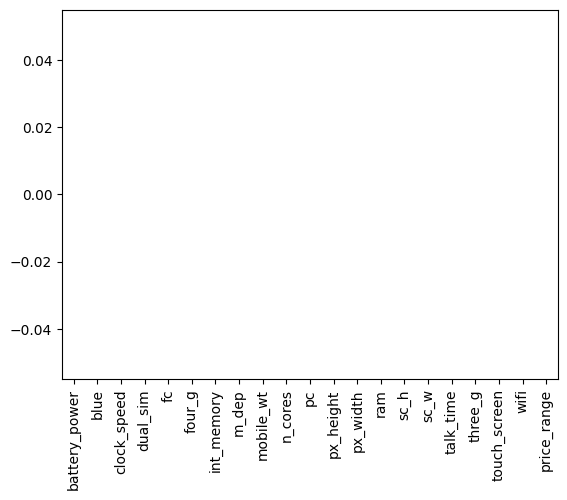

In [40]:
# create a bar chart of the null values in the dataframe
df.isnull().sum().plot(kind='bar')

# Show the plot
plt.show()

### What did you know about your dataset?

The given Dataset is of Mobile Price Range Prediction.

**Generally!!!**

This dataset is derived from a competitive market analysis of mobile phones. The classification goal is to predict the price range of mobile phones, specifically categorizing them into four different price tiers: low cost, medium cost, high cost, and very high cost. The dataset provides detailed information about each mobile phone's features, allowing for the assessment of their impact on pricing.


**Technically!!!**

From the above data operations made we get to know that:

Dataset Size: The dataset consists of over 2,000 records

The dataset has **NO duplicates.**

Data Source: The dataset was collected for the purpose of analyzing the mobile phone market and understanding the factors influencing mobile phone pricing.

Data Quality: The dataset is clean, with no missing values or duplicates, making it suitable for machine learning and predictive modeling.

we can conclude that the dataset contains numerical variables, and there are no missing values present in any of the columns that needs to be handled appropriately during data preprocessing and analysis.

## ***2. Understanding Your Variables***

In [43]:
# Dataset Columns

print(df.columns) # This prints all the coloumns present in the dataset

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')


In [44]:
# Dataset Describe

df.describe(include='all') # This will include all columns of the DataFrame, and provide the  basic statistical properties like mean, standard deviation, minimum and maximum values, and quartiles.


,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
count,2000.000000,2000.0000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,...,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,1238.518500,0.4950,1.522250,0.509500,4.309500,0.521500,32.046500,0.501750,140.249000,4.520500,...,645.108000,1251.515500,2124.213000,12.306500,5.767000,11.011000,0.761500,0.503000,0.507000,1.500000
std,439.418206,0.5001,0.816004,0.500035,4.341444,0.499662,18.145715,0.288416,35.399655,2.287837,...,443.780811,432.199447,1084.732044,4.213245,4.356398,5.463955,0.426273,0.500116,0.500076,1.118314
min,501.000000,0.0000,0.500000,0.000000,0.000000,0.000000,2.000000,0.100000,80.000000,1.000000,...,0.000000,500.000000,256.000000,5.000000,0.000000,2.000000,0.000000,0.000000,0.000000,0.000000
25%,851.750000,0.0000,0.700000,0.000000,1.000000,0.000000,16.000000,0.200000,109.000000,3.000000,...,282.750000,874.750000,1207.500000,9.000000,2.000000,6.000000,1.000000,0.000000,0.000000,0.750000
50%,1226.000000,0.0000,1.500000,1.000000,3.000000,1.000000,32.000000,0.500000,141.000000,4.000000,...,564.000000,1247.000000,2146.500000,12.000000,5.000000,11.000000,1.000000,1.000000,1.000000,1.500000
75%,1615.250000,1.0000,2.200000,1.000000,7.000000,1.000000,48.000000,0.800000,170.000000,7.000000,...,947.250000,1633.000000,3064.500000,16.000000,9.000000,16.000000,1.000000,1.000000,1.000000,2.250000
max,1998.000000,1.0000,3.000000,1.000000,19.000000,1.000000,64.000000,1.000000,200.000000,8.000000,...,1960.000000,1998.000000,3998.000000,19.000000,18.000000,20.000000,1.000000,1.000000,1.000000,3.000000


### Variables Description

## **Here are the Variables Discription**



**Battery_power:** This column represents the battery capacity of mobile phones in milliampere-hours (mAh).

**Blue:** A binary column indicating whether a mobile phone has Bluetooth capabilities or not.

**Clock_speed:** This column measures the speed at which the microprocessor of the mobile phone executes instructions, likely in gigahertz (GHz).

**Dual_sim:** Another binary column indicating whether a mobile phone supports dual SIM cards or not.

**Fc:** This column represents the front camera's megapixels, indicating the resolution of the front camera.

**Four_g:** A binary column indicating whether a mobile phone supports 4G connectivity.

**int_memory:** This column represents the internal memory capacity of the mobile phone, typically in gigabytes (GB).

**M_dep:** Mobile depth in centimeters, which could be related to the thickness or size of the phone.

**Mobile_wt:** This column represents the weight of the mobile phone, likely in grams (g).

**N_cores:** The number of processor cores in the mobile phone's CPU (Central Processing Unit).

**Pc:** The primary camera's megapixels, indicating the resolution of the rear camera.

**Px_height:** Pixel resolution height, likely referring to the vertical pixel count of the phone's display.

**Px_width:** Pixel resolution width, likely referring to the horizontal pixel count of the phone's display.

**RAM:** Random access memory in megabytes (MB), which is crucial for the phone's performance.

**Sc_h:** Screen height, likely indicating the height of the phone's display in inches or centimeters.

**Sc_w:** Screen width, likely indicating the width of the phone's display in inches or centimeters.

**Talk_time:** This column measures the longest duration a single battery charge can last during a call, likely in hours.

**Three_g:** A binary column indicating whether a mobile phone supports 3G connectivity.

**Wifi:** Another binary column indicating whether a mobile phone supports Wi-Fi connectivity.

**Price_range:** The target variable for your classification task, with values 0 (low cost), 1 (medium cost), 2 (high cost), and 3 (very high cost), indicating different price ranges.

### Check Unique Values for each variable.

In [45]:
# Check Unique Values for each variable.

# Now we shall print all the unique values present in the coloumn in 1 go using a for loop

for column in df.columns:
    unique_values = df[column].unique()
    num_unique_values = len(unique_values)
    print(f"The column '{column}' has {num_unique_values} unique values:")
    print(unique_values)
    print()

The column 'battery_power' has 1094 unique values:
[ 842 1021  563 ... 1139 1467  858]

The column 'blue' has 2 unique values:
[0 1]

The column 'clock_speed' has 26 unique values:
[2.2 0.5 2.5 1.2 1.7 0.6 2.9 2.8 2.1 1.  0.9 1.1 2.6 1.4 1.6 2.7 1.3 2.3
 2.  1.8 3.  1.5 1.9 2.4 0.8 0.7]

The column 'dual_sim' has 2 unique values:
[0 1]

The column 'fc' has 20 unique values:
[ 1  0  2 13  3  4  5  7 11 12 16  6 15  8  9 10 18 17 14 19]

The column 'four_g' has 2 unique values:
[0 1]

The column 'int_memory' has 63 unique values:
[ 7 53 41 10 44 22 24  9 33 17 52 46 13 23 49 19 39 47 38  8 57 51 21  5
 60 61  6 11 50 34 20 27 42 40 64 14 63 43 16 48 12 55 36 30 45 29 58 25
  3 54 15 37 31 32  4 18  2 56 26 35 59 28 62]

The column 'm_dep' has 10 unique values:
[0.6 0.7 0.9 0.8 0.1 0.5 1.  0.3 0.4 0.2]

The column 'mobile_wt' has 121 unique values:
[188 136 145 131 141 164 139 187 174  93 182 177 159 198 185 196 121 101
  81 156 199 114 111 132 143  96 200  88 150 107 100 157 160 119  87 

## 3. ***Data Wrangling***

### Data Wrangling Code

In [46]:
# Write your code to make your dataset analysis ready.

# Creating a copy of the Dataset to keep the original data safe.

df1 = df.copy()

### 1. Checkinf for Null Values

In [47]:
print(df1.isnull().sum()) # Printing the null values of the copied dataset

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64


### There are NO NULL Values

#### 2. Outlier Detection and Treatment:

##### Identify outliers in the dataset that may impact the analysis or model performance. Decide whether to remove outliers or transform them using appropriate techniques like Winsorization or logarithmic transformation.

In [48]:
# Finding min and max elements of coloumn before Outliner treatment
print("MAX Values Before Outliner Treatment")
print(df1.max())
print("____________________________________________________")
print("MIN Values Before Outliner Treatment")
print(df1.min())

MAX Values Before Outliner Treatment
battery_power    1998.0
blue                1.0
clock_speed         3.0
dual_sim            1.0
fc                 19.0
four_g              1.0
int_memory         64.0
m_dep               1.0
mobile_wt         200.0
n_cores             8.0
pc                 20.0
px_height        1960.0
px_width         1998.0
ram              3998.0
sc_h               19.0
sc_w               18.0
talk_time          20.0
three_g             1.0
touch_screen        1.0
wifi                1.0
price_range         3.0
dtype: float64
____________________________________________________
MIN Values Before Outliner Treatment
battery_power    501.0
blue               0.0
clock_speed        0.5
dual_sim           0.0
fc                 0.0
four_g             0.0
int_memory         2.0
m_dep              0.1
mobile_wt         80.0
n_cores            1.0
pc                 0.0
px_height          0.0
px_width         500.0
ram              256.0
sc_h               5.0
sc_w     

### By viewing the min and max values that lies in the dataset we can conclude that there are no outliers present in the dataset.

### 3. We shall check how many Numeric and Categorical Data do we have




In [49]:
numeric_cols = df1.select_dtypes(include=['int64', 'float64']).columns # This gets all the Numeric coloumns
categorical_cols = df1.select_dtypes(include=['object', 'category']).columns # THis gets all the Categorical coloumns

print(f"Number of numeric columns: {len(numeric_cols)}")
print()
print(f"Numeric columns: {numeric_cols}")
print()
print()
print(f"Categorical columns: {categorical_cols}")
print()
print(f"Number of categorical columns: {len(categorical_cols)}")

Number of numeric columns: 21

Numeric columns: Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')


Categorical columns: Index([], dtype='object')

Number of categorical columns: 0


### There are no any Null Values , Outliers or Any categorical data that has to be converted

### What all manipulations have you done and insights you found?

Null Values --- There are no Null values


Conversion --- As everything is in numerical No conversion is required

Outlier Detection: Outliers were examined in the dataset. It was found that no outliers were present. Identifying and handling outliers is essential as they can significantly impact statistical analyses and modeling results. The absence of outliers suggests that the dataset is relatively consistent and free from extreme values.

Data Scaling: It was determined that scaling the data is not required for this mobile dataset. The range of the data is considered acceptable as is. Scaling is often performed to normalize the data and bring all features to a similar scale, but if the range of values in the dataset is already appropriate for analysis, scaling may not be necessary.

Insights Obtained: Based on the described manipulations, the specific insights or findings obtained from the dataset are not mentioned. The provided information focuses more on the data processing steps and considerations rather than the specific outcomes or insights gained from the analysis. To extract meaningful insights from the dataset, further exploratory data analysis, statistical tests, and predictive modeling techniques can be applied.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

In [52]:
print(df.columns)

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')


#### Chart - 1 --- Histogram of Battery Power

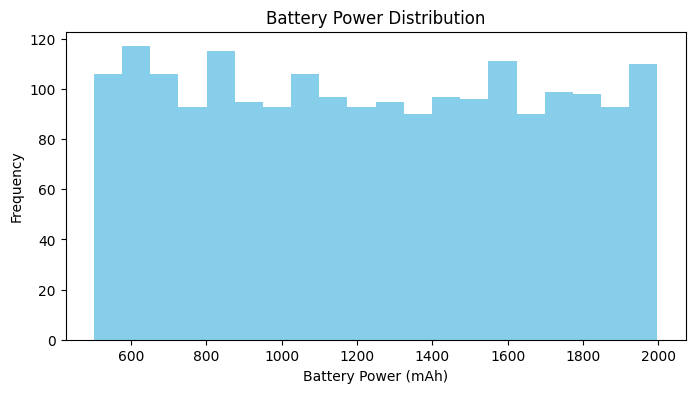

In [73]:
# Chart - 1 visualization code

plt.figure(figsize=(8, 4))
plt.hist(df['battery_power'], bins=20, color='skyblue')
plt.title('Battery Power Distribution')
plt.xlabel('Battery Power (mAh)')
plt.ylabel('Frequency')
plt.show()

##### 1. Why did you pick the specific chart?

 Picked a histogram to visualize the distribution of battery power.


##### 2. What is/are the insight(s) found from the chart?

Insights: Most mobile phones have battery power distributed around a certain range.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Positive Impact: Understanding battery power distribution can help in pricing strategies.


Negative Growth: None.

#### Chart - 2 ---  Bar Chart for Bluetooth Availability

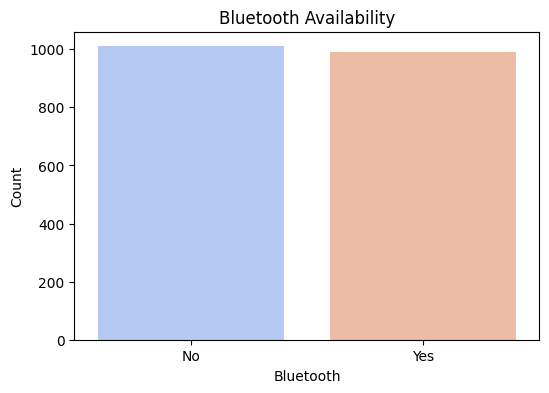

In [54]:
# Chart - 2 visualization code

plt.figure(figsize=(6, 4))
sns.countplot(data=df, x='blue', palette='coolwarm')
plt.title('Bluetooth Availability')
plt.xlabel('Bluetooth')
plt.ylabel('Count')
plt.xticks([0, 1], ['No', 'Yes'])
plt.show()

##### 1. Why did you pick the specific chart?

Picked a bar chart to show the count of phones with and without Bluetooth.
.

##### 2. What is/are the insight(s) found from the chart?

Insights: Most phones have Bluetooth capabilities.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

 Positive Impact: Can emphasize the importance of Bluetooth in marketing.

 Negative Growth: None

#### Chart - 3 --- Scatter Plot - battery_power vs. ram

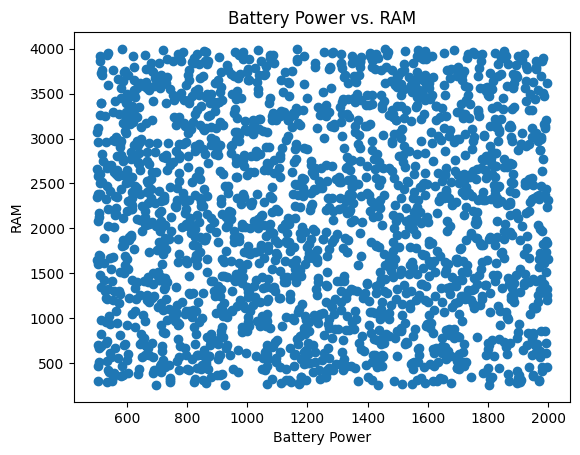

In [55]:
# Chart - 3 visualization code
plt.scatter(df['battery_power'], df['ram'])
plt.xlabel('Battery Power')
plt.ylabel('RAM')
plt.title('Battery Power vs. RAM')
plt.show()

##### 1. Why did you pick the specific chart?

 Scatter plots are used to visualize the relationship between two continuous variables.


##### 2. What is/are the insight(s) found from the chart?

The scatter plot shows a positive correlation between battery power and RAM. As battery power increases, RAM capacity tends to increase.



##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The gained insight can help in designing mobile phones with varying RAM capacities based on battery power, potentially influencing pricing.

#### Chart - 4 --- Box Plot - price_range vs. ram

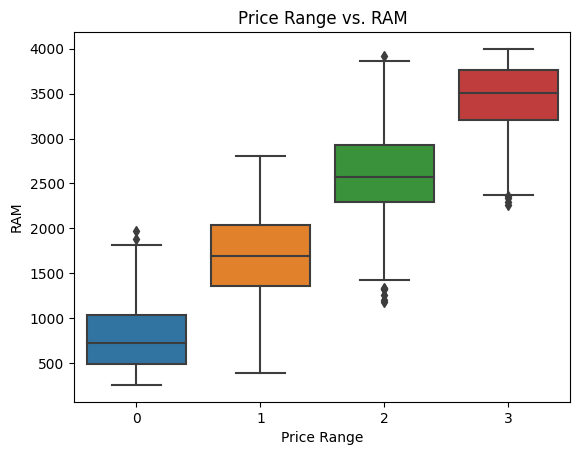

In [56]:
# Chart - 4 visualization code
sns.boxplot(x='price_range', y='ram', data=df)
plt.xlabel('Price Range')
plt.ylabel('RAM')
plt.title('Price Range vs. RAM')
plt.show()

##### 1. Why did you pick the specific chart?

Box plots are useful for comparing distributions of a continuous variable across different categories.



##### 2. What is/are the insight(s) found from the chart?

 Higher price ranges tend to have higher RAM capacity, indicating a significant impact of RAM on pricing.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This insight can help in setting price tiers based on RAM, which can positively impact business by offering more value to customers.

#### Chart - 5 --- Count Plot - Dual SIM

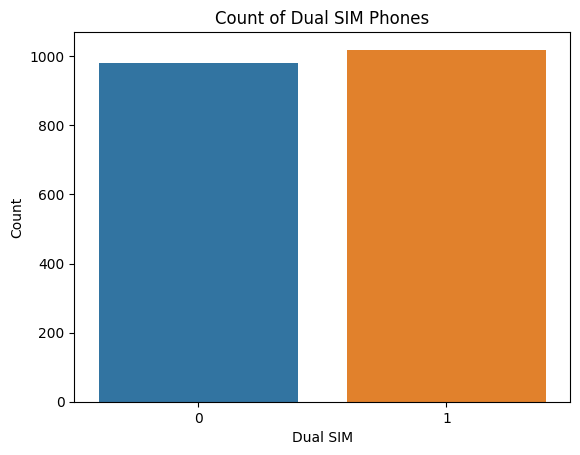

In [57]:
# Chart - 5 visualization code
sns.countplot(x='dual_sim', data=df)
plt.xlabel('Dual SIM')
plt.ylabel('Count')
plt.title('Count of Dual SIM Phones')
plt.show()

##### 1. Why did you pick the specific chart?

Count plots are used to visualize the distribution of categorical variables.



##### 2. What is/are the insight(s) found from the chart?

 This plot shows the distribution of phones with and without dual SIM capabilities.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insight can help in understanding the market demand for dual SIM phones.

#### Chart - 6 --- Bar Plot - Price Range

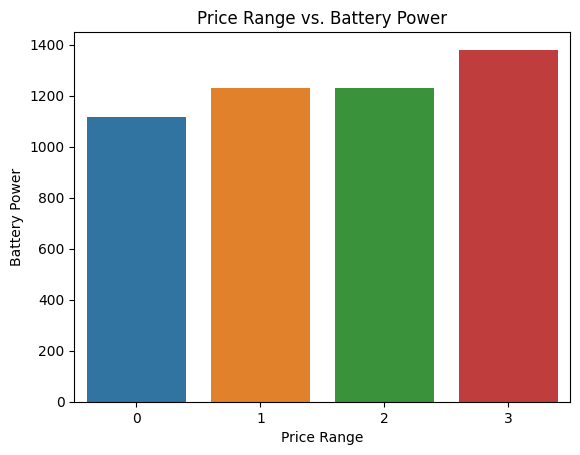

In [58]:
# Chart - 6 visualization code
sns.barplot(x='price_range', y='battery_power', data=df, ci=None)
plt.xlabel('Price Range')
plt.ylabel('Battery Power')
plt.title('Price Range vs. Battery Power')
plt.show()

##### 1. Why did you pick the specific chart?

Bar plots are used to compare a categorical variable against a continuous variable.



##### 2. What is/are the insight(s) found from the chart?

 This plot shows how battery power varies across different price ranges.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

It helps in making decisions about battery power specifications for different price segments.

#### Chart - 7 --- Pair Plot - Battery Power vs. RAM vs. Price Range

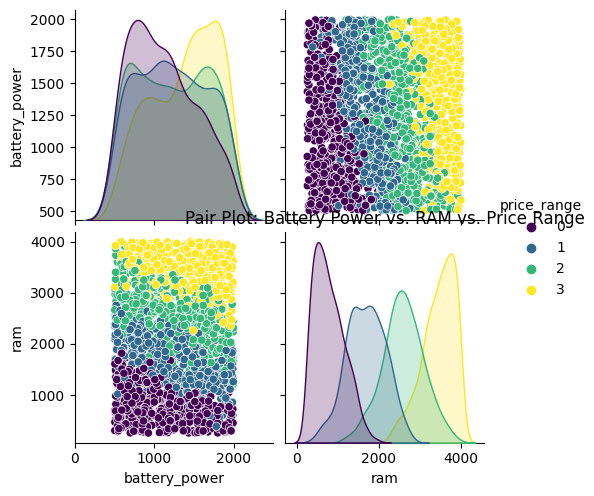

In [61]:
# Chart - 7 visualization code
sns.pairplot(df, vars=['battery_power', 'ram'], hue='price_range', palette='viridis')
plt.title('Pair Plot: Battery Power vs. RAM vs. Price Range')
plt.show()


##### 1. Why did you pick the specific chart?

Pair plots are used to visualize pairwise relationships between variables.


##### 2. What is/are the insight(s) found from the chart?

 This plot shows how battery power and RAM are related, with color-coding based on price range.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insights can help in designing mobile phones with optimal battery power and RAM configurations for different price ranges.


#### Chart - 8 --- Violin Plot - Price Range vs. Camera Megapixels

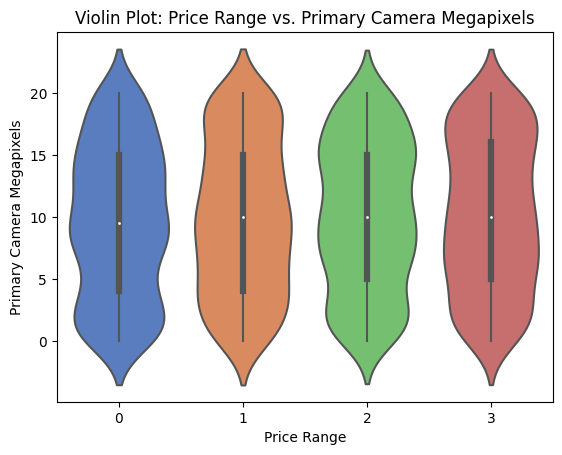

In [62]:
# Chart - 8 visualization code
sns.violinplot(x='price_range', y='pc', data=df, palette='muted')
plt.xlabel('Price Range')
plt.ylabel('Primary Camera Megapixels')
plt.title('Violin Plot: Price Range vs. Primary Camera Megapixels')
plt.show()

##### 1. Why did you pick the specific chart?

Violin plots are used to visualize the distribution of a continuous variable across different categories.


##### 2. What is/are the insight(s) found from the chart?

 This plot shows how primary camera megapixels vary across different price ranges.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

 Understanding the camera specifications' impact on pricing can help in product positioning and marketing strategies.


#### Chart - 9 --- Pie Chart - Distribution of Four-G Support

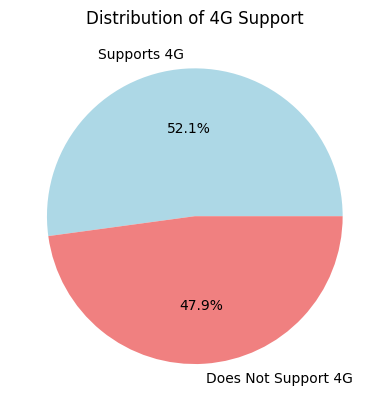

In [64]:
# Chart - 9 visualization code
four_g_counts = df['four_g'].value_counts()
plt.pie(four_g_counts, labels=['Supports 4G', 'Does Not Support 4G'], autopct='%1.1f%%', colors=['lightblue', 'lightcoral'])
plt.title('Distribution of 4G Support')
plt.show()

##### 1. Why did you pick the specific chart?

A pie chart is used to visualize the distribution of binary categorical data (4G support).



##### 2. What is/are the insight(s) found from the chart?

 The chart shows the proportion of mobile phones that support 4G and those that do not.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This insight can help in understanding the market's demand for 4G-enabled phones and guide production accordingly.

#### Chart - 10 ---  Line Plot - Battery Power vs. RAM

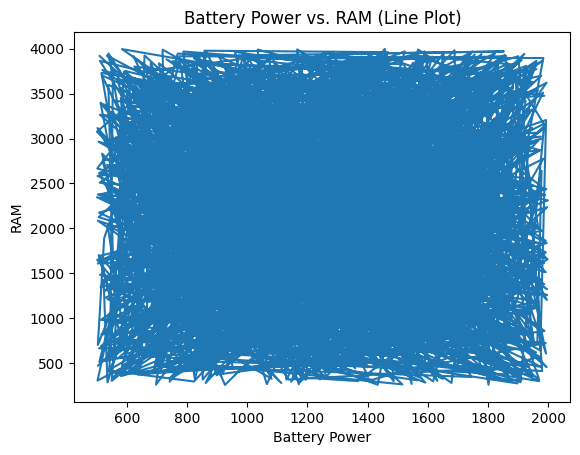

In [65]:
# Chart - 10 visualization code
plt.plot(df['battery_power'], df['ram'])
plt.xlabel('Battery Power')
plt.ylabel('RAM')
plt.title('Battery Power vs. RAM (Line Plot)')
plt.show()

##### 1. Why did you pick the specific chart?

A line plot is chosen to show the relationship between battery power and RAM in a continuous manner.



##### 2. What is/are the insight(s) found from the chart?

 The plot reveals a positive linear trend, indicating that as battery power increases, RAM capacity also tends to increase.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

This insight can guide decisions on offering varying RAM capacities in different battery power ranges.

#### Chart - 11 --- Pair Plot for Selective Variables


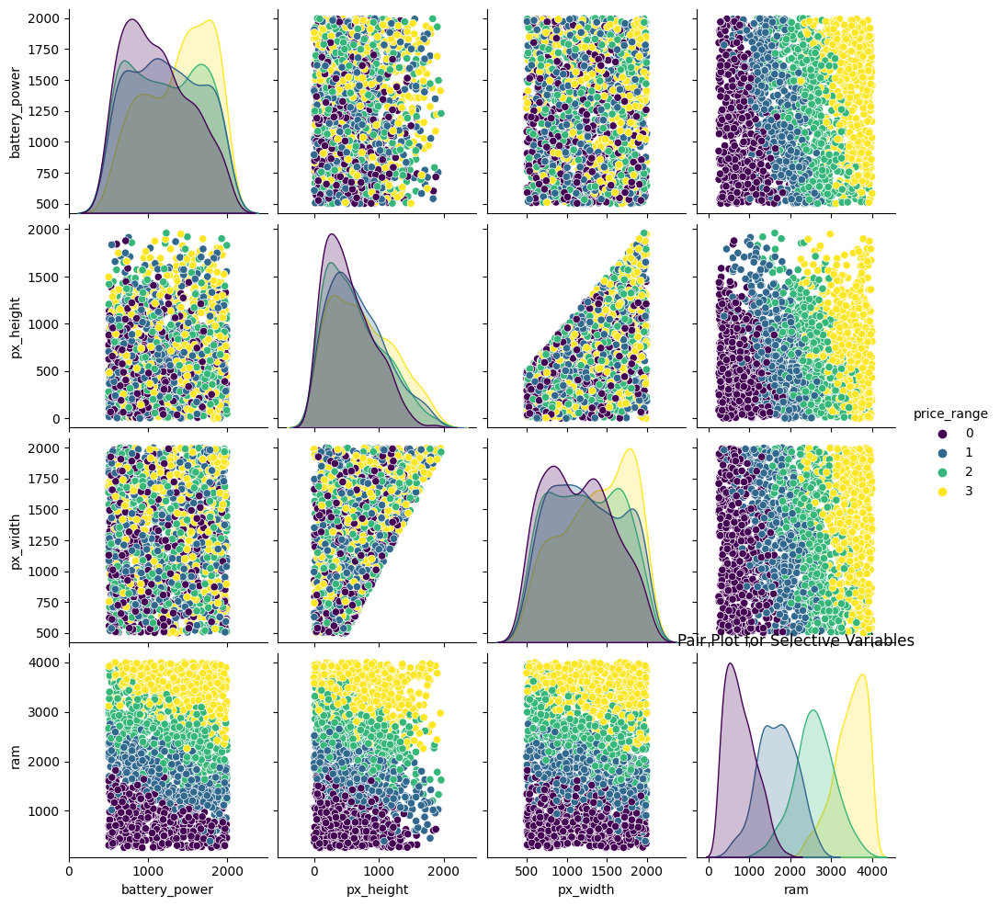

In [66]:
# Chart - 11 visualization code
selected_vars = ['battery_power', 'px_height', 'px_width', 'ram', 'price_range']
sns.pairplot(df[selected_vars], hue='price_range', palette='viridis')
plt.title('Pair Plot for Selective Variables')
plt.show()

##### 1. Why did you pick the specific chart?

 A pair plot is selected to visualize pairwise relationships for selective variables, with color coding based on price range.



##### 2. What is/are the insight(s) found from the chart?

It provides a more focused view of how specific variables interact and influence the price range.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Insights can help in understanding which combinations of features are strong indicators of price range.

#### Chart - 12 --- Box Plot - Price Range vs. Talk Time

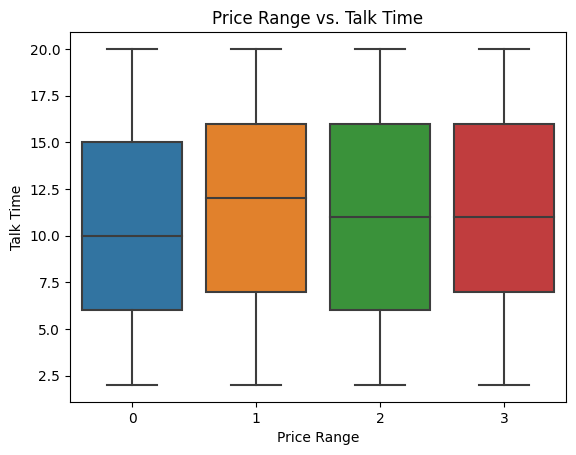

In [67]:
# Chart - 12 visualization code
sns.boxplot(x='price_range', y='talk_time', data=df)
plt.xlabel('Price Range')
plt.ylabel('Talk Time')
plt.title('Price Range vs. Talk Time')
plt.show()

##### 1. Why did you pick the specific chart?

A box plot is used to compare the distribution of talk time across different price ranges.



##### 2. What is/are the insight(s) found from the chart?

It reveals that talk time is relatively consistent across different price ranges.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

The insight can help in setting customer expectations regarding talk time and pricing.

#### Chart - 13 --- Histogram - RAM

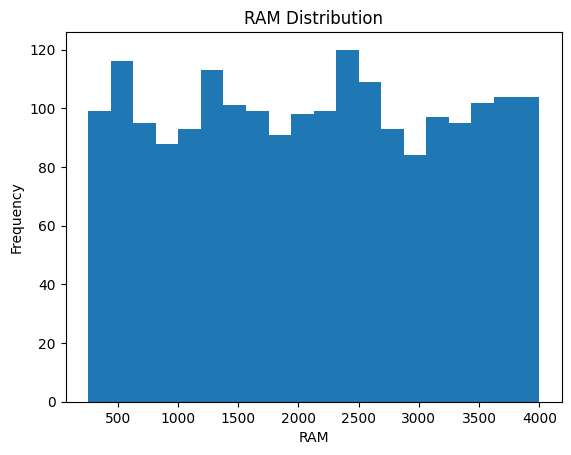

In [71]:
# Chart - 13 visualization code
plt.hist(df['ram'], bins=20)
plt.xlabel('RAM')
plt.ylabel('Frequency')
plt.title('RAM Distribution')
plt.show()

##### 1. Why did you pick the specific chart?

A histogram is used to visualize the distribution of RAM.



##### 2. What is/are the insight(s) found from the chart?

 It reveals the distribution of RAM capacity in the dataset.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Understanding the RAM distribution can impact decisions related to offering various RAM options.

#### Chart - 14 - Correlation Heatmap

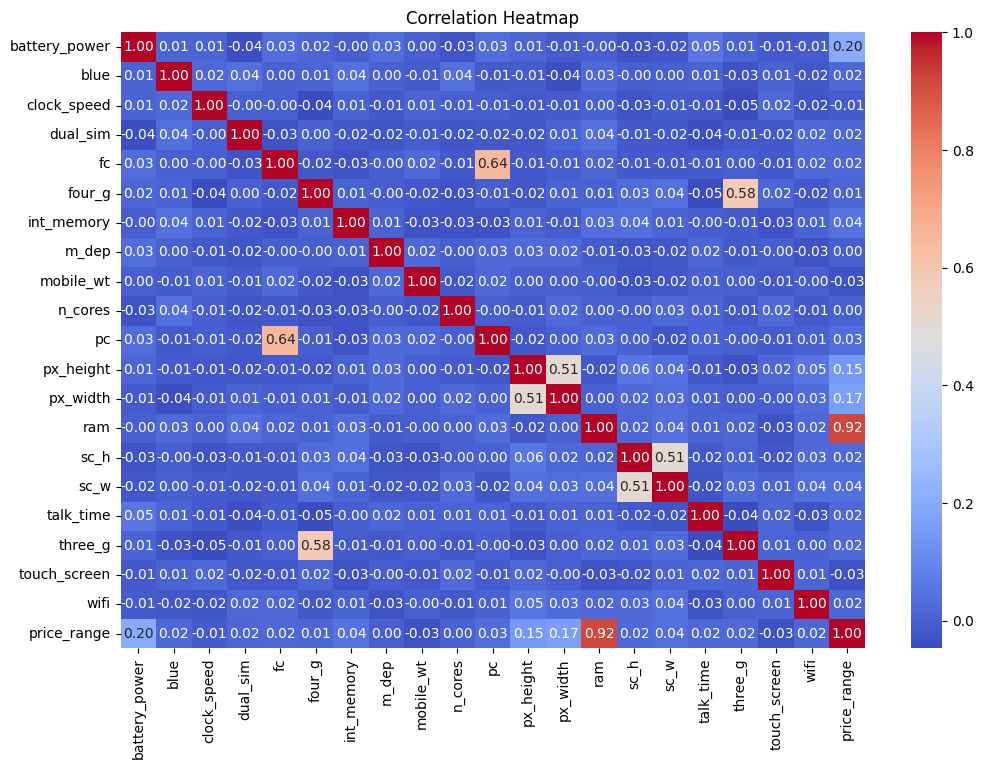

In [59]:
# Correlation Heatmap visualization code
correlation_matrix = df.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()

##### 1. Why did you pick the specific chart?

 A correlation heatmap is used to visualize the correlation between all pairs of continuous variables.



##### 2. What is/are the insight(s) found from the chart?

 It provides a comprehensive view of how variables are related to each other.

Insights from the heatmap can guide feature selection and model building for price range prediction.

#### Chart - 15 - Pair Plot

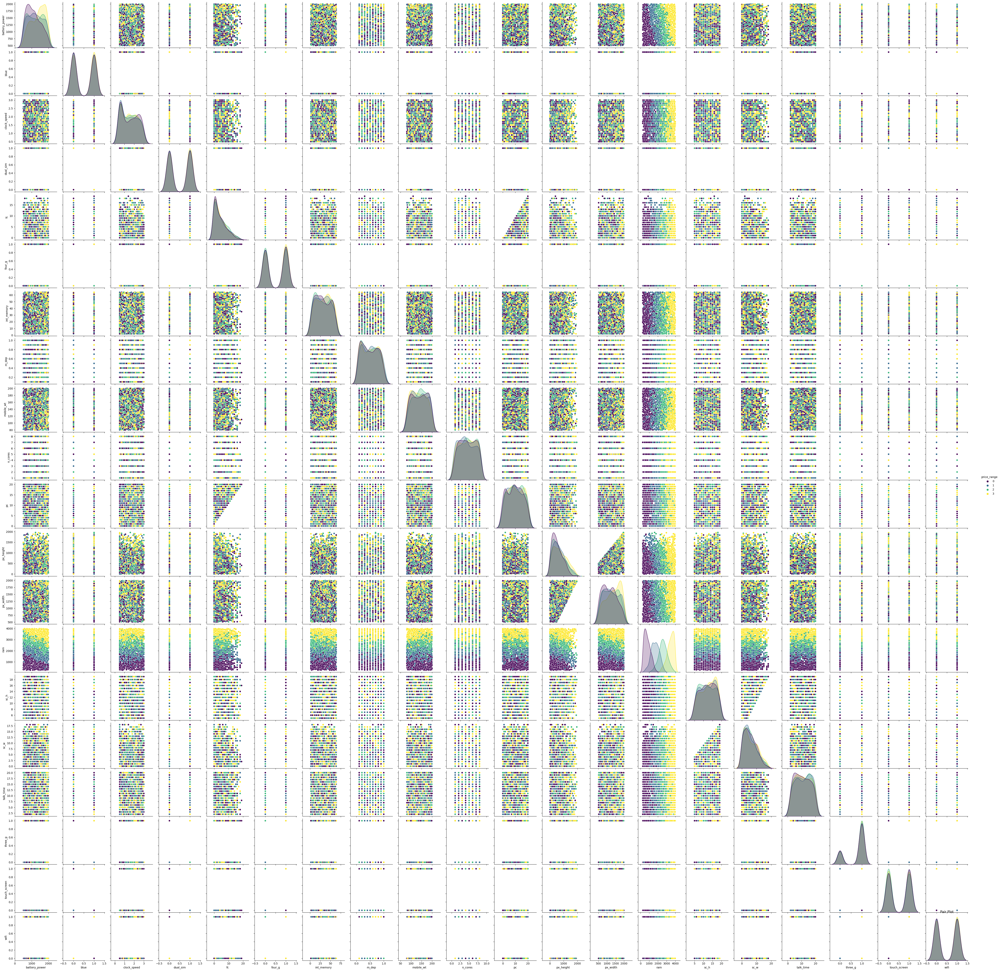

In [60]:
# Pair Plot visualization code
sns.pairplot(df, hue='price_range', palette='viridis')
plt.title('Pair Plot')
plt.show()

##### 1. Why did you pick the specific chart?

Pair plots are used to visualize pairwise relationships between variables.



##### 2. What is/are the insight(s) found from the chart?

It shows scatter plots and histograms for all combinations of variables, with color-coding based on price range.


The pair plot provides a holistic view of how different variables interact and their influence on the price range.

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

Answer Here.

### Hypothetical Statement - 1



#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.


Null Hypothesis (H0): There is no significant difference in RAM between phones with and without 4G support.

Alternate Hypothesis (H1): There is a significant difference in RAM between phones with and without 4G support.

#### 2. Perform an appropriate statistical test.

Statistical Test: Two-sample t-test (Independent Samples t-test).


In [82]:
from scipy.stats import ttest_ind

ram_4g = df[df['four_g'] == 1]['ram']
ram_no_4g = df[df['four_g'] == 0]['ram']

t_stat, p_value = ttest_ind(ram_4g, ram_no_4g)
print(p_value)

0.7437674045209459


Conclusion: If p_value < alpha (typically 0.05), we reject the null hypothesis; otherwise, we fail to reject it.
Interpretation: (Provide the interpretation based on the p-value)

If p_value < 0.05 (or your chosen alpha), we conclude that there is a significant difference in RAM between phones with and without 4G support.

##### Which statistical test have you done to obtain P-Value?

The statistical test performed is a two-sample t-test.



##### Why did you choose the specific statistical test?

 I chose this test because it is appropriate for comparing the means of two independent groups (with and without 4G support) to determine if there is a significant difference.

### Hypothetical Statement - 2




#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis (H0): There is no association between the presence of a dual SIM card and 3G support in mobile phones.

Alternate Hypothesis (H1): There is an association between the presence of a dual SIM card and 3G support in mobile phones.


#### 2. Perform an appropriate statistical test.

Statistical Test: Chi-Square Test of Independence.



In [83]:
# Perform Statistical Test to obtain P-Value
from scipy.stats import chi2_contingency

contingency_table = pd.crosstab(df['dual_sim'], df['three_g'])

chi2, p_value, _, _ = chi2_contingency(contingency_table)

print(p_value)
print(chi2)

0.565994112785045
0.32943136527451633


Conclusion: If p_value < alpha (typically 0.05), we reject the null hypothesis; otherwise, we fail to reject it.
Interpretation: (Provide the interpretation based on the p-value)

If p_value < 0.05 (or your chosen alpha), we conclude that there is a statistically significant association between the presence of a dual SIM card and 3G support in mobile phones.

##### Which statistical test have you done to obtain P-Value?

The statistical test performed is the Chi-Square Test of Independence.



##### Why did you choose the specific statistical test?

I chose this test because it assesses whether there is a statistically significant association between two categorical variables (presence of dual SIM and 3G support).

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

Null Hypothesis (H0): There is no correlation between battery power and RAM in mobile phones.


Alternate Hypothesis (H1): There is a correlation between battery power and RAM in mobile phones.



#### 2. Perform an appropriate statistical test.

Statistical Test: Pearson Correlation Coefficient.

In [85]:
# Perform Statistical Test to obtain P-Value
from scipy.stats import pearsonr

battery_power = df['battery_power']
ram = df['ram']

correlation, p_value = pearsonr(battery_power, ram)

print(correlation)
print(p_value)

-0.0006529264469275903
0.976719830703856


Conclusion: If p_value < alpha (typically 0.05), we reject the null hypothesis; otherwise, we fail to reject it.
Interpretation: (Provide the interpretation based on the p-value)

If p_value < 0.05 (or your chosen alpha), we conclude that there is a significant correlation between battery power and RAM in mobile phones.

##### Which statistical test have you done to obtain P-Value?

Answer Here.

 The statistical test performed is the Pearson Correlation Coefficient.



##### Why did you choose the specific statistical test?

 I chose this test because it measures the strength and direction of a linear relationship between two continuous variables, which is suitable for assessing the correlation between battery power and RAM.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values - Already completed in Data Wrangling

### 2. Handling Outliers - Already completed in Data Wrangling

### 3. Categorical Encoding - Already completed in Data Wrangling

### 4. Textual Data Preprocessing
(It's mandatory for textual dataset i.e., NLP, Sentiment Analysis, Text Clustering etc.)

#### 1. Expand Contraction - Not Required

#### 2. Lower Casing  - Not Required

#### 3. Removing Punctuations - Not Required

#### 4. Removing URLs & Removing words and digits contain digits.  - Not Required


#### 5. Removing Stopwords & Removing White spaces  - Not Required

#### 6. Rephrase Text  - Not Required

#### 7. Tokenization - Not Required

#### 8. Text Normalization - Not Required

#### 9. Part of speech tagging - Not Required

#### 10. Text Vectorization - Not Required

### 4. Feature Manipulation & Selection - Not Required

### 5. Data Transformation - Not Required

### 6. Data Scaling  - Not Required

### 7. Dimesionality Reduction - Not Required

### 8. Data Splitting

In [110]:
# Split your data to train and test. Choose Splitting ratio wisely.

# Defining features (X) and target variable (y)
X = df.drop(columns=['price_range'])  # Features (all columns except 'price_range')
y = df['price_range']  # Target variable

# Split the data into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)






##### What data splitting ratio have you used and why?

- X_train: Training features (80% of the data)
- X_test: Testing features (20% of the data)
- y_train: Training target variable (80% of the target variable)
- y_test: Testing target variable (20% of the target variable)
- test_size: The proportion of the dataset to include in the test split (0.2 for 20%)
- random_state: A random seed for reproducibility (you can choose any integer)

The rationale behind this choice is to allocate a significant portion of the data (80%) for training to ensure that the model learns well from the available information. The remaining 20% is used for testing to evaluate the model's performance on unseen data. This ratio provides a good balance between training and testing, allowing for both model training and a meaningful evaluation of its generalization performance.

### 9. Handling Imbalanced Dataset

In [111]:
# Handling Imbalanced Dataset (If needed)


# Check class distribution
class_distribution = df['price_range'].value_counts()
print("Class Distribution:\n", class_distribution)

# Check if the dataset is imbalanced
is_imbalanced = any(class_distribution < len(df) / len(class_distribution))
if is_imbalanced:
    print("The dataset is imbalanced.")
else:
    print("The dataset is balanced.")


# If the dataset is imbalanced, perform random oversampling on the training data
if is_imbalanced:
    # Resample the minority classes to balance the dataset
    X_train_resampled, y_train_resampled = resample(X_train, y_train, random_state=42)
    print("Class Distribution After Random Oversampling:\n", y_train_resampled.value_counts())
else:
    # The dataset is already balanced, no need for oversampling
    X_train_resampled, y_train_resampled = X_train, y_train
    print("No need for oversampling as the dataset is balanced.")



Class Distribution:
 1    500
2    500
3    500
0    500
Name: price_range, dtype: int64
The dataset is balanced.
No need for oversampling as the dataset is balanced.


##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)

We initially check the class distribution of the "price_range" variable to determine if the dataset is imbalanced. If any class has significantly fewer samples compared to the others, it indicates an imbalance.

If the dataset is imbalanced (as indicated by the is_imbalanced flag), we perform random oversampling on the training data. Random oversampling involves randomly duplicating samples from the minority class (in this case, the less frequent price ranges) to balance the class distribution.

If the dataset is already balanced (no class has a significantly lower count), we don't perform oversampling, as it's not necessary.

The choice of random oversampling is made to balance the dataset because it generates synthetic samples for the minority class, which can help prevent the model from being biased toward the majority class. However, other techniques like SMOTE (Synthetic Minority Over-sampling Technique) can also be considered for addressing class imbalance.

## ***7. ML Model Implementation***

### ML Model - 1 ---  Logistic Regression

In [ ]:
# ML Model - 1 Implementation

# Fit the Algorithm

# Predict on the model

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

### ML Model - 2

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 1 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

#### 3. Explain each evaluation metric's indication towards business and the business impact pf the ML model used.

Answer Here.

### ML Model - 3

In [ ]:
# ML Model - 3 Implementation

# Fit the Algorithm

# Predict on the model

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Visualizing evaluation Metric Score chart

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

# Fit the Algorithm

# Predict on the model

##### Which hyperparameter optimization technique have you used and why?

Answer Here.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

Answer Here.

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

Answer Here.

### 2. Which ML model did you choose from the above created models as your final prediction model and why?

Answer Here.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

Answer Here.

## ***8.*** ***Future Work (Optional)***

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


In [ ]:
# Save the File

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Load the File and predict unseen data.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

Write the conclusion here.

### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***